In [0]:
from google.colab import files
uploaded = files.upload()

Saving movie.metadata.tsv to movie.metadata.tsv
Saving plot_summaries.txt to plot_summaries.txt


In [0]:
#importing all the necessary libraries
import pandas as pd
import numpy as np
import nltk
import re
import seaborn
import csv
from tqdm import tqdm
import json
import seaborn as sns
import matplotlib.pyplot as plt 
import datetime

In [0]:
#loading the data
meta=pd.read_csv("movie.metadata.tsv",sep='\t',header=None)

In [0]:
meta.head()

,movie_id,1,movie_name,date,4,5,6,7,genre
0,975900,/m/03vyhn,Ghosts of Mars,2001-08-24,14010832.0,98.0,"{""/m/02h40lc"": ""English Language""}","{""/m/09c7w0"": ""United States of America""}","{""/m/01jfsb"": ""Thriller"", ""/m/06n90"": ""Science..."
1,3196793,/m/08yl5d,Getting Away with Murder: The JonBenét Ramsey ...,2000-02-16,NaN,95.0,"{""/m/02h40lc"": ""English Language""}","{""/m/09c7w0"": ""United States of America""}","{""/m/02n4kr"": ""Mystery"", ""/m/03bxz7"": ""Biograp..."
2,28463795,/m/0crgdbh,Brun bitter,1988,NaN,83.0,"{""/m/05f_3"": ""Norwegian Language""}","{""/m/05b4w"": ""Norway""}","{""/m/0lsxr"": ""Crime Fiction"", ""/m/07s9rl0"": ""D..."
3,9363483,/m/0285_cd,White Of The Eye,1987,NaN,110.0,"{""/m/02h40lc"": ""English Language""}","{""/m/07ssc"": ""United Kingdom""}","{""/m/01jfsb"": ""Thriller"", ""/m/0glj9q"": ""Erotic..."
4,261236,/m/01mrr1,A Woman in Flames,1983,NaN,106.0,"{""/m/04306rv"": ""German Language""}","{""/m/0345h"": ""Germany""}","{""/m/07s9rl0"": ""Drama""}"


In [0]:
#rename the columns
meta.columns=["movie_id",1,"movie_name","date",4,5,6,7,"genre"]

In [0]:
meta.head()

,movie_id,1,movie_name,date,4,5,6,7,genre
0,975900,/m/03vyhn,Ghosts of Mars,2001-08-24,14010832.0,98.0,"{""/m/02h40lc"": ""English Language""}","{""/m/09c7w0"": ""United States of America""}","{""/m/01jfsb"": ""Thriller"", ""/m/06n90"": ""Science..."
1,3196793,/m/08yl5d,Getting Away with Murder: The JonBenét Ramsey ...,2000-02-16,NaN,95.0,"{""/m/02h40lc"": ""English Language""}","{""/m/09c7w0"": ""United States of America""}","{""/m/02n4kr"": ""Mystery"", ""/m/03bxz7"": ""Biograp..."
2,28463795,/m/0crgdbh,Brun bitter,1988,NaN,83.0,"{""/m/05f_3"": ""Norwegian Language""}","{""/m/05b4w"": ""Norway""}","{""/m/0lsxr"": ""Crime Fiction"", ""/m/07s9rl0"": ""D..."
3,9363483,/m/0285_cd,White Of The Eye,1987,NaN,110.0,"{""/m/02h40lc"": ""English Language""}","{""/m/07ssc"": ""United Kingdom""}","{""/m/01jfsb"": ""Thriller"", ""/m/0glj9q"": ""Erotic..."
4,261236,/m/01mrr1,A Woman in Flames,1983,NaN,106.0,"{""/m/04306rv"": ""German Language""}","{""/m/0345h"": ""Germany""}","{""/m/07s9rl0"": ""Drama""}"


In [0]:

plots=[]
with open("plot_summaries.txt",'r') as f:
  reader=csv.reader(f,dialect='excel-tab')
  for row in tqdm(reader):
    plots.append(row)

42303it [00:00, 50096.76it/s]


In [0]:
movie_id=[]
plot=[]
for i in tqdm(plots):
  movie_id.append(i[0])
  plot.append(i[1])

100%|██████████| 42303/42303 [00:00<00:00, 956375.92it/s]


In [0]:
movies=pd.DataFrame({'movie_id':movie_id,'plot':plot})


In [0]:
movies.head()

,movie_id,plot
0,23890098,"Shlykov, a hard-working taxi driver and Lyosha..."
1,31186339,The nation of Panem consists of a wealthy Capi...
2,20663735,Poovalli Induchoodan is sentenced for six yea...
3,2231378,"The Lemon Drop Kid , a New York City swindler,..."
4,595909,Seventh-day Adventist Church pastor Michael Ch...


In [0]:
# change datatype of 'movie_id'
meta['movie_id'] = meta['movie_id'].astype(str)

# merge meta with movies
movies = pd.merge(movies, meta[['movie_id', 'movie_name','date', 'genre']], on = 'movie_id')

movies.head()

,movie_id,plot,movie_name,date,genre
0,23890098,"Shlykov, a hard-working taxi driver and Lyosha...",Taxi Blues,1990-09-07,"{""/m/07s9rl0"": ""Drama"", ""/m/03q4nz"": ""World ci..."
1,31186339,The nation of Panem consists of a wealthy Capi...,The Hunger Games,2012-03-12,"{""/m/03btsm8"": ""Action/Adventure"", ""/m/06n90"":..."
2,20663735,Poovalli Induchoodan is sentenced for six yea...,Narasimham,2000,"{""/m/04t36"": ""Musical"", ""/m/02kdv5l"": ""Action""..."
3,2231378,"The Lemon Drop Kid , a New York City swindler,...",The Lemon Drop Kid,1951-03-08,"{""/m/06qm3"": ""Screwball comedy"", ""/m/01z4y"": ""..."
4,595909,Seventh-day Adventist Church pastor Michael Ch...,A Cry in the Dark,1988-11-03,"{""/m/0lsxr"": ""Crime Fiction"", ""/m/07s9rl0"": ""D..."


In [0]:
movies['genre'][0]


'{"/m/07s9rl0": "Drama", "/m/03q4nz": "World cinema"}'

In [0]:
type(json.loads(movies['genre'][0]))

dict

In [0]:
json.loads(movies['genre'][0]).values()

dict_values(['Drama', 'World cinema'])

In [0]:
# an empty list
genres = [] 

# extract genres
for i in movies['genre']: 
  genres.append(list(json.loads(i).values())) 

# add to 'movies' dataframe  
movies['genre_new'] = genres

In [0]:
# remove samples with 0 genre tags
movies_new = movies[~(movies['genre_new'].str.len() == 0)]

In [0]:
movies_new.shape, movies.shape

((41793, 6), (42204, 6))

In [0]:
movies.head()

,movie_id,plot,movie_name,date,genre,genre_new
0,23890098,"Shlykov, a hard-working taxi driver and Lyosha...",Taxi Blues,1990-09-07,"{""/m/07s9rl0"": ""Drama"", ""/m/03q4nz"": ""World ci...","[Drama, World cinema]"
1,31186339,The nation of Panem consists of a wealthy Capi...,The Hunger Games,2012-03-12,"{""/m/03btsm8"": ""Action/Adventure"", ""/m/06n90"":...","[Action/Adventure, Science Fiction, Action, Dr..."
2,20663735,Poovalli Induchoodan is sentenced for six yea...,Narasimham,2000,"{""/m/04t36"": ""Musical"", ""/m/02kdv5l"": ""Action""...","[Musical, Action, Drama, Bollywood]"
3,2231378,"The Lemon Drop Kid , a New York City swindler,...",The Lemon Drop Kid,1951-03-08,"{""/m/06qm3"": ""Screwball comedy"", ""/m/01z4y"": ""...","[Screwball comedy, Comedy]"
4,595909,Seventh-day Adventist Church pastor Michael Ch...,A Cry in the Dark,1988-11-03,"{""/m/0lsxr"": ""Crime Fiction"", ""/m/07s9rl0"": ""D...","[Crime Fiction, Drama, Docudrama, World cinema..."


In [0]:
all_genres = sum(genres,[])
len(set(all_genres))

363

In [0]:
all_genres = nltk.FreqDist(all_genres) 

# create dataframe
all_genres_df = pd.DataFrame({'Genre': list(all_genres.keys()), 
                              'Count': list(all_genres.values())})

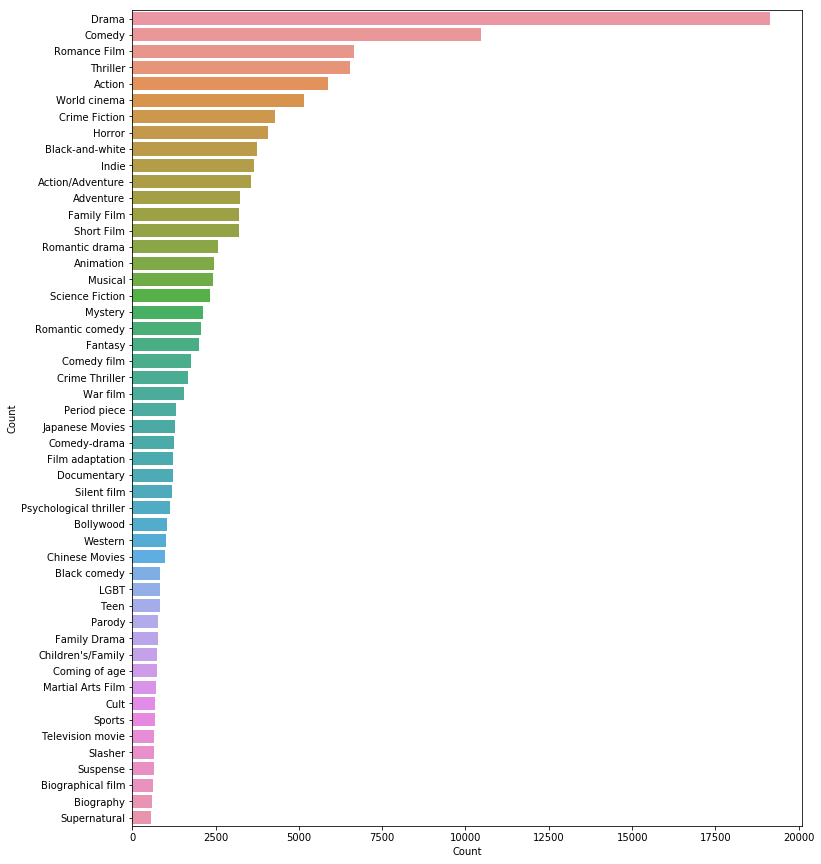

In [0]:
g = all_genres_df.nlargest(columns="Count", n = 50) 
plt.figure(figsize=(12,15)) 
ax = sns.barplot(data=g, x= "Count", y = "Genre") 
ax.set(ylabel = 'Count') 
plt.show()

In [0]:
# function for text cleaning 
def clean_text(text):
    # remove backslash-apostrophe 
    text = re.sub("\'", "", text) 
    # remove everything except alphabets 
    text = re.sub("[^a-zA-Z]"," ",text) 
    # remove whitespaces 
    text = ' '.join(text.split()) 
    # convert text to lowercase 
    text = text.lower() 
    
    return text

In [0]:
movies_new['clean_plot'] = movies_new['plot'].apply(lambda x: clean_text(x))

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  """Entry point for launching an IPython kernel.


In [0]:
movies_new.head()

,movie_id,plot,movie_name,date,genre,genre_new,clean_plot
0,23890098,"Shlykov, a hard-working taxi driver and Lyosha...",Taxi Blues,1990-09-07,"{""/m/07s9rl0"": ""Drama"", ""/m/03q4nz"": ""World ci...","[Drama, World cinema]",shlykov a hard working taxi driver and lyosha ...
1,31186339,The nation of Panem consists of a wealthy Capi...,The Hunger Games,2012-03-12,"{""/m/03btsm8"": ""Action/Adventure"", ""/m/06n90"":...","[Action/Adventure, Science Fiction, Action, Dr...",the nation of panem consists of a wealthy capi...
2,20663735,Poovalli Induchoodan is sentenced for six yea...,Narasimham,2000,"{""/m/04t36"": ""Musical"", ""/m/02kdv5l"": ""Action""...","[Musical, Action, Drama, Bollywood]",poovalli induchoodan is sentenced for six year...
3,2231378,"The Lemon Drop Kid , a New York City swindler,...",The Lemon Drop Kid,1951-03-08,"{""/m/06qm3"": ""Screwball comedy"", ""/m/01z4y"": ""...","[Screwball comedy, Comedy]",the lemon drop kid a new york city swindler is...
4,595909,Seventh-day Adventist Church pastor Michael Ch...,A Cry in the Dark,1988-11-03,"{""/m/0lsxr"": ""Crime Fiction"", ""/m/07s9rl0"": ""D...","[Crime Fiction, Drama, Docudrama, World cinema...",seventh day adventist church pastor michael ch...


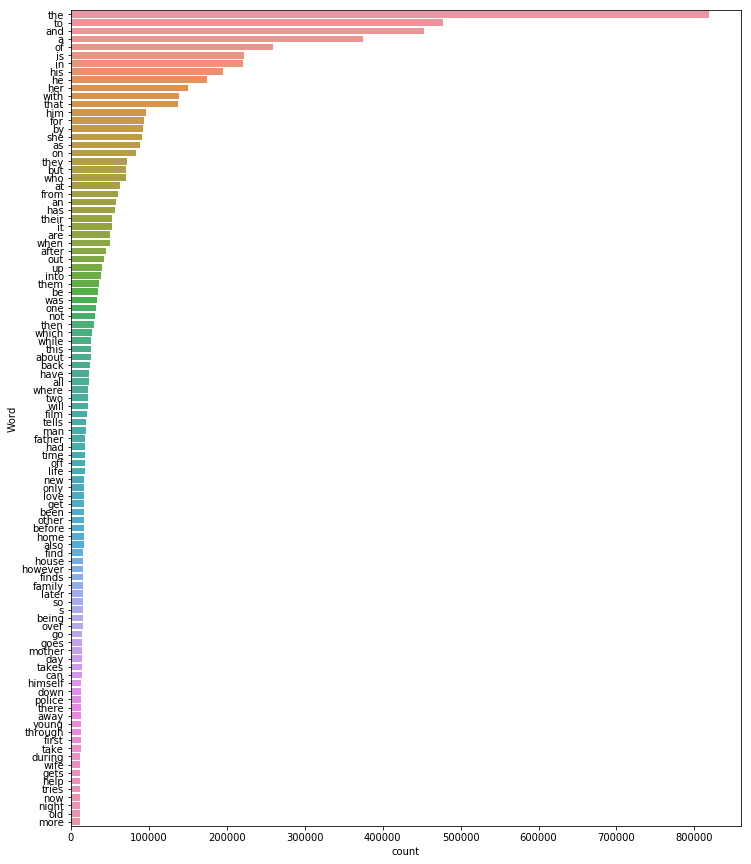

In [0]:
def freq_words(x, terms = 30): 
  all_words = ' '.join([text for text in x]) 
  all_words = all_words.split() 
  fdist = nltk.FreqDist(all_words) 
  words_df = pd.DataFrame({'word':list(fdist.keys()), 'count':list(fdist.values())}) 
  
  # selecting top 20 most frequent words 
  d = words_df.nlargest(columns="count", n = terms) 
  
  # visualize words and frequencies
  plt.figure(figsize=(12,15)) 
  ax = sns.barplot(data=d, x= "count", y = "word") 
  ax.set(ylabel = 'Word') 
  plt.show()
  
# print 100 most frequent words 
freq_words(movies_new['clean_plot'], 100)

In [0]:
movies_new.head()

,movie_id,plot,movie_name,date,genre,genre_new,clean_plot
0,23890098,"Shlykov, a hard-working taxi driver and Lyosha...",Taxi Blues,1990-09-07,"{""/m/07s9rl0"": ""Drama"", ""/m/03q4nz"": ""World ci...","[Drama, World cinema]",shlykov a hard working taxi driver and lyosha ...
1,31186339,The nation of Panem consists of a wealthy Capi...,The Hunger Games,2012-03-12,"{""/m/03btsm8"": ""Action/Adventure"", ""/m/06n90"":...","[Action/Adventure, Science Fiction, Action, Dr...",the nation of panem consists of a wealthy capi...
2,20663735,Poovalli Induchoodan is sentenced for six yea...,Narasimham,2000,"{""/m/04t36"": ""Musical"", ""/m/02kdv5l"": ""Action""...","[Musical, Action, Drama, Bollywood]",poovalli induchoodan is sentenced for six year...
3,2231378,"The Lemon Drop Kid , a New York City swindler,...",The Lemon Drop Kid,1951-03-08,"{""/m/06qm3"": ""Screwball comedy"", ""/m/01z4y"": ""...","[Screwball comedy, Comedy]",the lemon drop kid a new york city swindler is...
4,595909,Seventh-day Adventist Church pastor Michael Ch...,A Cry in the Dark,1988-11-03,"{""/m/0lsxr"": ""Crime Fiction"", ""/m/07s9rl0"": ""D...","[Crime Fiction, Drama, Docudrama, World cinema...",seventh day adventist church pastor michael ch...


In [0]:
movies_new['year'] = movies_new['date'].str[:4]
movies_new.head()

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  """Entry point for launching an IPython kernel.


,movie_id,plot,movie_name,date,genre,genre_new,clean_plot,year
0,23890098,"Shlykov, a hard-working taxi driver and Lyosha...",Taxi Blues,1990-09-07,"{""/m/07s9rl0"": ""Drama"", ""/m/03q4nz"": ""World ci...","[Drama, World cinema]",shlykov a hard working taxi driver and lyosha ...,1990
1,31186339,The nation of Panem consists of a wealthy Capi...,The Hunger Games,2012-03-12,"{""/m/03btsm8"": ""Action/Adventure"", ""/m/06n90"":...","[Action/Adventure, Science Fiction, Action, Dr...",the nation of panem consists of a wealthy capi...,2012
2,20663735,Poovalli Induchoodan is sentenced for six yea...,Narasimham,2000,"{""/m/04t36"": ""Musical"", ""/m/02kdv5l"": ""Action""...","[Musical, Action, Drama, Bollywood]",poovalli induchoodan is sentenced for six year...,2000
3,2231378,"The Lemon Drop Kid , a New York City swindler,...",The Lemon Drop Kid,1951-03-08,"{""/m/06qm3"": ""Screwball comedy"", ""/m/01z4y"": ""...","[Screwball comedy, Comedy]",the lemon drop kid a new york city swindler is...,1951
4,595909,Seventh-day Adventist Church pastor Michael Ch...,A Cry in the Dark,1988-11-03,"{""/m/0lsxr"": ""Crime Fiction"", ""/m/07s9rl0"": ""D...","[Crime Fiction, Drama, Docudrama, World cinema...",seventh day adventist church pastor michael ch...,1988


In [0]:
movies_new.drop(['date','plot','genre'], axis=1)

,movie_id,movie_name,genre_new,clean_plot,year
0,23890098,Taxi Blues,"[Drama, World cinema]",shlykov a hard working taxi driver and lyosha ...,1990
1,31186339,The Hunger Games,"[Action/Adventure, Science Fiction, Action, Dr...",the nation of panem consists of a wealthy capi...,2012
2,20663735,Narasimham,"[Musical, Action, Drama, Bollywood]",poovalli induchoodan is sentenced for six year...,2000
3,2231378,The Lemon Drop Kid,"[Screwball comedy, Comedy]",the lemon drop kid a new york city swindler is...,1951
4,595909,A Cry in the Dark,"[Crime Fiction, Drama, Docudrama, World cinema...",seventh day adventist church pastor michael ch...,1988
5,5272176,End Game,"[Thriller, Action/Adventure, Action, Drama]",the president is on his way to give a speech w...,2006
6,1952976,Dark Water,"[Thriller, Drama, Horror]",plot the film opens in as a young girl dahlia ...,2005
7,24225279,Sing,"[Drama, Teen]",the story begins with hannah a young jewish te...,1989
8,2462689,Meet John Doe,"[Romantic comedy, Media Satire, Americana, Com...",infuriated at being told to write one final co...,1941
9,20532852,Destination Meatball,"[Short Film, Family Film, Animation]",a line of people drool at the window of the sh...,1951


In [0]:
import nltk.tokenize as nt
nltk.download('punkt')


[nltk_data] Downloading package punkt to /root/nltk_data...
[nltk_data]   Unzipping tokenizers/punkt.zip.


True

In [0]:
nltk.download('averaged_perceptron_tagger')

[nltk_data] Downloading package averaged_perceptron_tagger to
[nltk_data]     /root/nltk_data...
[nltk_data]   Unzipping taggers/averaged_perceptron_tagger.zip.


True

In [0]:
from nltk import word_tokenize, pos_tag, pos_tag_sents


text=movies_new['clean_plot'].tolist()

tagged_texts = pos_tag_sents(map(word_tokenize, text))

In [0]:
tagged_texts


[[('shlykov', 'VB'),
  ('a', 'DT'),
  ('hard', 'JJ'),
  ('working', 'VBG'),
  ('taxi', 'NN'),
  ('driver', 'NN'),
  ('and', 'CC'),
  ('lyosha', 'VB'),
  ('a', 'DT'),
  ('saxophonist', 'NN'),
  ('develop', 'VB'),
  ('a', 'DT'),
  ('bizarre', 'JJ'),
  ('love', 'NN'),
  ('hate', 'NN'),
  ('relationship', 'NN'),
  ('and', 'CC'),
  ('despite', 'IN'),
  ('their', 'PRP$'),
  ('prejudices', 'NNS'),
  ('realize', 'VBP'),
  ('they', 'PRP'),
  ('arent', 'VBP'),
  ('so', 'RB'),
  ('different', 'JJ'),
  ('after', 'IN'),
  ('all', 'DT')],
 [('the', 'DT'),
  ('nation', 'NN'),
  ('of', 'IN'),
  ('panem', 'NN'),
  ('consists', 'NNS'),
  ('of', 'IN'),
  ('a', 'DT'),
  ('wealthy', 'JJ'),
  ('capitol', 'NN'),
  ('and', 'CC'),
  ('twelve', 'VB'),
  ('poorer', 'JJR'),
  ('districts', 'NNS'),
  ('as', 'IN'),
  ('punishment', 'NN'),
  ('for', 'IN'),
  ('a', 'DT'),
  ('past', 'JJ'),
  ('rebellion', 'NN'),
  ('each', 'DT'),
  ('district', 'NN'),
  ('must', 'MD'),
  ('provide', 'VB'),
  ('a', 'DT'),
  ('boy', 'N

In [0]:
movies_new['grammatical Desciption'] = pos_tag_sents( movies_new['clean_plot'].apply(word_tokenize).tolist() )

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  """Entry point for launching an IPython kernel.


In [0]:
movies_new.head()

,movie_id,plot,movie_name,date,genre,genre_new,clean_plot,year,grammatical Desciption
0,23890098,"Shlykov, a hard-working taxi driver and Lyosha...",Taxi Blues,1990-09-07,"{""/m/07s9rl0"": ""Drama"", ""/m/03q4nz"": ""World ci...","[Drama, World cinema]",shlykov a hard working taxi driver and lyosha ...,1990,"[(shlykov, VB), (a, DT), (hard, JJ), (working,..."
1,31186339,The nation of Panem consists of a wealthy Capi...,The Hunger Games,2012-03-12,"{""/m/03btsm8"": ""Action/Adventure"", ""/m/06n90"":...","[Action/Adventure, Science Fiction, Action, Dr...",the nation of panem consists of a wealthy capi...,2012,"[(the, DT), (nation, NN), (of, IN), (panem, NN..."
2,20663735,Poovalli Induchoodan is sentenced for six yea...,Narasimham,2000,"{""/m/04t36"": ""Musical"", ""/m/02kdv5l"": ""Action""...","[Musical, Action, Drama, Bollywood]",poovalli induchoodan is sentenced for six year...,2000,"[(poovalli, NN), (induchoodan, NN), (is, VBZ),..."
3,2231378,"The Lemon Drop Kid , a New York City swindler,...",The Lemon Drop Kid,1951-03-08,"{""/m/06qm3"": ""Screwball comedy"", ""/m/01z4y"": ""...","[Screwball comedy, Comedy]",the lemon drop kid a new york city swindler is...,1951,"[(the, DT), (lemon, JJ), (drop, NN), (kid, VBD..."
4,595909,Seventh-day Adventist Church pastor Michael Ch...,A Cry in the Dark,1988-11-03,"{""/m/0lsxr"": ""Crime Fiction"", ""/m/07s9rl0"": ""D...","[Crime Fiction, Drama, Docudrama, World cinema...",seventh day adventist church pastor michael ch...,1988,"[(seventh, JJ), (day, NN), (adventist, VB), (c..."


In [0]:
movies=movies_new.drop(['date','plot','genre'], axis=1)

In [0]:
movies.head()

,movie_id,movie_name,genre_new,clean_plot,year,grammatical Desciption
0,23890098,Taxi Blues,"[Drama, World cinema]",shlykov a hard working taxi driver and lyosha ...,1990,"[(shlykov, VB), (a, DT), (hard, JJ), (working,..."
1,31186339,The Hunger Games,"[Action/Adventure, Science Fiction, Action, Dr...",the nation of panem consists of a wealthy capi...,2012,"[(the, DT), (nation, NN), (of, IN), (panem, NN..."
2,20663735,Narasimham,"[Musical, Action, Drama, Bollywood]",poovalli induchoodan is sentenced for six year...,2000,"[(poovalli, NN), (induchoodan, NN), (is, VBZ),..."
3,2231378,The Lemon Drop Kid,"[Screwball comedy, Comedy]",the lemon drop kid a new york city swindler is...,1951,"[(the, DT), (lemon, JJ), (drop, NN), (kid, VBD..."
4,595909,A Cry in the Dark,"[Crime Fiction, Drama, Docudrama, World cinema...",seventh day adventist church pastor michael ch...,1988,"[(seventh, JJ), (day, NN), (adventist, VB), (c..."


In [0]:
from google.colab import files
movies.to_csv('movies.csv') 
files.download('movies.csv')

In [0]:
movies.columns=["movie_id","movie_name","genre","plot","year","grammatical_description"]

In [0]:
movies.head()

,movie_id,movie_name,genre,plot,year,grammatical_description
0,23890098,Taxi Blues,"[Drama, World cinema]",shlykov a hard working taxi driver and lyosha ...,1990,"[(shlykov, VB), (a, DT), (hard, JJ), (working,..."
1,31186339,The Hunger Games,"[Action/Adventure, Science Fiction, Action, Dr...",the nation of panem consists of a wealthy capi...,2012,"[(the, DT), (nation, NN), (of, IN), (panem, NN..."
2,20663735,Narasimham,"[Musical, Action, Drama, Bollywood]",poovalli induchoodan is sentenced for six year...,2000,"[(poovalli, NN), (induchoodan, NN), (is, VBZ),..."
3,2231378,The Lemon Drop Kid,"[Screwball comedy, Comedy]",the lemon drop kid a new york city swindler is...,1951,"[(the, DT), (lemon, JJ), (drop, NN), (kid, VBD..."
4,595909,A Cry in the Dark,"[Crime Fiction, Drama, Docudrama, World cinema...",seventh day adventist church pastor michael ch...,1988,"[(seventh, JJ), (day, NN), (adventist, VB), (c..."


In [0]:
movies=movies[['movie_id','movie_name','year','genre','plot','grammatical_description']]

In [0]:
movies.head()

,movie_id,movie_name,year,genre,plot,grammatical_description
0,23890098,Taxi Blues,1990,"[Drama, World cinema]",shlykov a hard working taxi driver and lyosha ...,"[(shlykov, VB), (a, DT), (hard, JJ), (working,..."
1,31186339,The Hunger Games,2012,"[Action/Adventure, Science Fiction, Action, Dr...",the nation of panem consists of a wealthy capi...,"[(the, DT), (nation, NN), (of, IN), (panem, NN..."
2,20663735,Narasimham,2000,"[Musical, Action, Drama, Bollywood]",poovalli induchoodan is sentenced for six year...,"[(poovalli, NN), (induchoodan, NN), (is, VBZ),..."
3,2231378,The Lemon Drop Kid,1951,"[Screwball comedy, Comedy]",the lemon drop kid a new york city swindler is...,"[(the, DT), (lemon, JJ), (drop, NN), (kid, VBD..."
4,595909,A Cry in the Dark,1988,"[Crime Fiction, Drama, Docudrama, World cinema...",seventh day adventist church pastor michael ch...,"[(seventh, JJ), (day, NN), (adventist, VB), (c..."


In [0]:
from google.colab import files
uploaded = files.upload()

Saving movies.csv to movies.csv


In [0]:
dataset = pd.read_csv('movies.csv')
df = pd.DataFrame(dataset)
cols = [1,2,3,4,5,6]
df = df[df.columns[6]]

/usr/local/lib/python3.6/dist-packages/IPython/core/interactiveshell.py:2718: DtypeWarning: Columns (0,2,6,7,8,9,10,11,12,13,14,15,16,17,18,19,20,21,22,23,24,25,26,27,28,29,30,31,32,33,34,35,36,37,38,39,40,41,42,43,44,45,46,47,48,49,50,51,52,53,54,55,56,57,58,59,60,61,62,63,64,65,66,67,68,69,70,71,72,73,74,75,76,77,78,79,80,81,82,83,84,85,86,87,88,89,90,91,92,93,94,95,96,97,98,99,100,101,102,103,104,105,106,107,108,109,110,111,112,113,114,115,116,117,118,119,120,121,122,123,124,125,126,127,128,129,130,131,132,133,134,135,136,137,138,139,140,141,142,143,144,145,146,147,148,149,150,151,152,153,154,155,156,157,158,159,160,161,162,163,164,165,166,167,168,169,170,171,172,173,174,175,176,177,178,179,180,181,182,183,184,185,186,187,188,189,190,191,192,193,194,195,196,197,198,199,200,201,202,203,204,205,206,207,208,209,210,211,212,213,214,215,216,217,218,219,220,221,222,223,224,225,226,227,228,229,230,231,232,233,234,235,236,237,238,239,240,241,242,243,244,245,246,247,248,249,250,251,252,253,2

In [0]:
df

0        NaN
1        NaN
2        NaN
3        NaN
4        NaN
5        NaN
6        NaN
7        NaN
8        NaN
9        NaN
10       NaN
11       NaN
12       NaN
13       NaN
14       NaN
15       NaN
16       NaN
17       NaN
18       NaN
19       NaN
20       NaN
21       NaN
22       NaN
23       NaN
24       NaN
25       NaN
26       NaN
27       NaN
28       NaN
29       NaN
        ... 
41859    NaN
41860    NaN
41861    NaN
41862    NaN
41863    NaN
41864    NaN
41865    NaN
41866    NaN
41867    NaN
41868    NaN
41869    NaN
41870    NaN
41871    NaN
41872    NaN
41873    NaN
41874    NaN
41875    NaN
41876    NaN
41877    NaN
41878    NaN
41879    NaN
41880    NaN
41881    NaN
41882    NaN
41883    NaN
41884    NaN
41885    NaN
41886    NaN
41887    NaN
41888    NaN
Name: Unnamed: 6, Length: 41889, dtype: object